<a href="https://colab.research.google.com/github/jdaniella039/Hands-on-Pemrosesan-Audio/blob/main/Tugas2_Multimedia.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Joy Daniella S
#122140039
#Multimedia

##Link Drive
https://drive.google.com/drive/folders/1sfQvdoI6uYI5O9bwmAQwtDimfvUUHfkk?usp=sharing

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
file_path = '/content/drive/MyDrive/Multimedia/rekaman1_joy.wav'

Mounted at /content/drive


#Soal 1: Rekaman dan Analisis Suara Multi-Level



Sample rate: 48000 Hz
Durasi: 28.31 detik


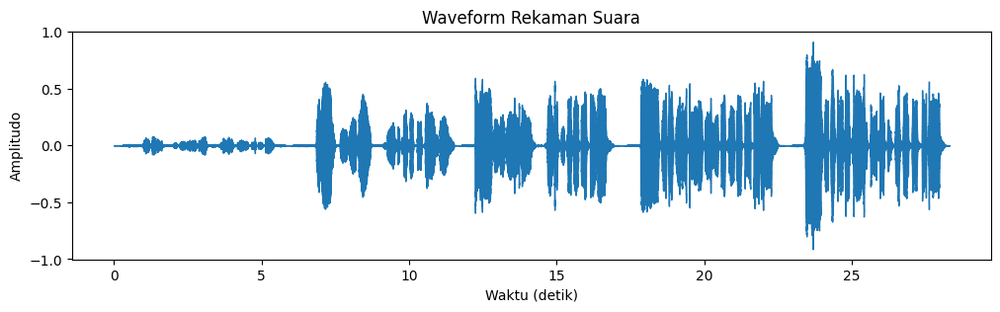

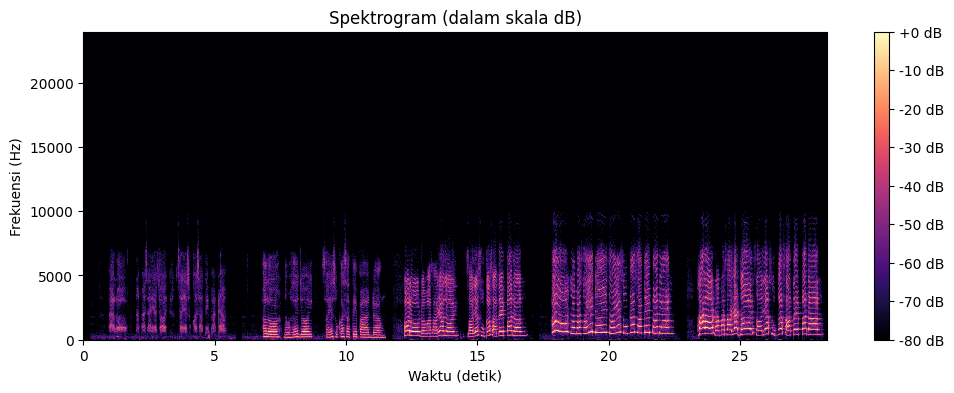

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

y, sr = librosa.load(file_path, sr=None)
duration = librosa.get_duration(y=y, sr=sr)
print(f"Sample rate: {sr} Hz")
print(f"Durasi: {duration:.2f} detik")

# --- Plot Waveform ---
plt.figure(figsize=(12, 3))
librosa.display.waveshow(y, sr=sr)
plt.title("Waveform Rekaman Suara")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()

# --- Plot Spektrogram ---
plt.figure(figsize=(12, 4))

# STFT = Short Time Fourier Transform
S = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz', cmap='magma')
plt.colorbar(format='%+2.0f dB')
plt.title("Spektrogram (dalam skala dB)")
plt.xlabel("Waktu (detik)")
plt.ylabel("Frekuensi (Hz)")
plt.show()

###Waveform
Waveform menunjukkan perubahan amplitudo suara terhadap waktu. Bagian gelombang yang kecil menandakan suara pelan, sedangkan yang besar menandakan suara keras. Dari grafik ini terlihat perubahan volume dari berbisik, normal, keras, cempreng, hingga berteriak selama 25 detik rekaman.

###Spektogram
Spektrogram menampilkan frekuensi dan intensitas suara terhadap waktu. Warna terang menunjukkan bagian suara dengan energi tinggi, sedangkan warna gelap menandakan suara pelan. Dari gambar terlihat bahwa sebagian besar energi suara menyebar hingga di atas 5000 Hz, yang menunjukkan adanya banyak nada tinggi. Hal ini wajar karena pada bagian suara cempreng dan berteriak, frekuensinya memang meningkat dan menghasilkan komponen suara di rentang frekuensi tinggi.

Sample rate baru: 16000 Hz
Durasi setelah resampling: 28.31 detik


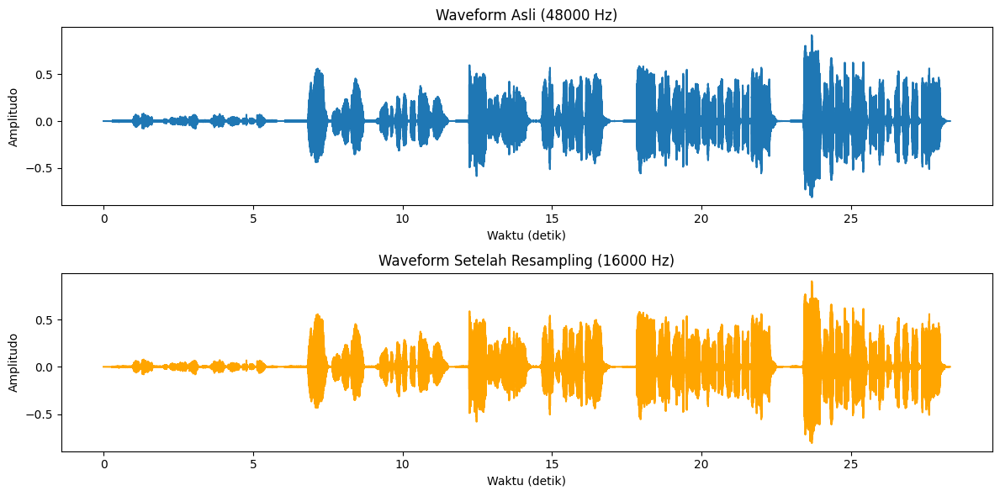

In [ ]:
import soundfile as sf

target_sr = 16000
audio_resampled = librosa.resample(y=y, orig_sr=sr, target_sr=target_sr)

# Simpan hasilnya
sf.write('/content/drive/MyDrive/rekaman_25s_resampled.wav', audio_resampled, target_sr)

print(f"Sample rate baru: {target_sr} Hz")
print(f"Durasi setelah resampling: {len(audio_resampled)/target_sr:.2f} detik")

plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(np.linspace(0, len(y)/sr, len(y)), y)
plt.title(f'Waveform Asli ({sr} Hz)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')

plt.subplot(2, 1, 2)
plt.plot(np.linspace(0, len(audio_resampled)/target_sr, len(audio_resampled)), audio_resampled, color='orange')
plt.title(f'Waveform Setelah Resampling ({target_sr} Hz)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')

plt.tight_layout()
plt.show()

####Waveform
Waveform bagian atas menunjukkan sinyal suara sebelum dilakukan resampling, dengan sample rate 48.000 Hz. Ini berarti dalam satu detik, ada 48.000 data titik suara yang direkam, sehingga detail suara — terutama pada nada tinggi — masih sangat jelas. Dari bentuk gelombang terlihat perubahan intensitas suara dari pelan, normal, keras, cempreng, hingga berteriak. Durasi rekaman sekitar 25 detik, dan amplitudonya bervariasi sesuai kekuatan suara yang dihasilkan.

###Spektogram
Waveform bagian bawah merupakan hasil resampling dengan sample rate diturunkan menjadi 16.000 Hz. Artinya, jumlah sampel per detik dikurangi tiga kali lipat dari sebelumnya. Walaupun bentuk umumnya masih sama, detail kecil pada gelombang menjadi lebih sederhana. Durasi rekaman sedikit berubah menjadi sekitar 28 detik, karena proses resampling dapat memengaruhi jumlah total sampel. Secara kualitas, suara hasil resampling terdengar sedikit kurang jernih dibanding versi asli, terutama di frekuensi tinggi, namun masih cukup baik untuk analisis atau pengenalan suara manusia.



#Soal 2: Noise Reduction dengan Filtering

Sample rate: 48000 Hz
Durasi: 11.44 detik


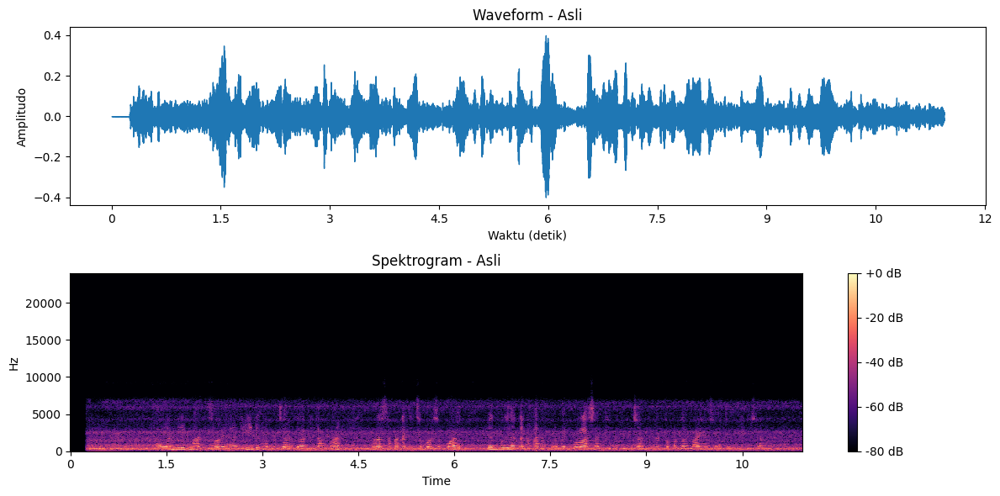

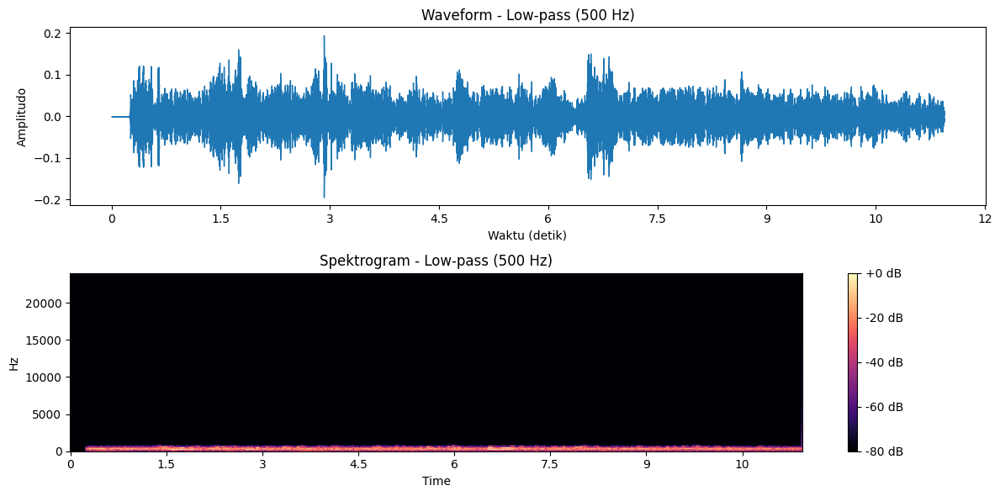

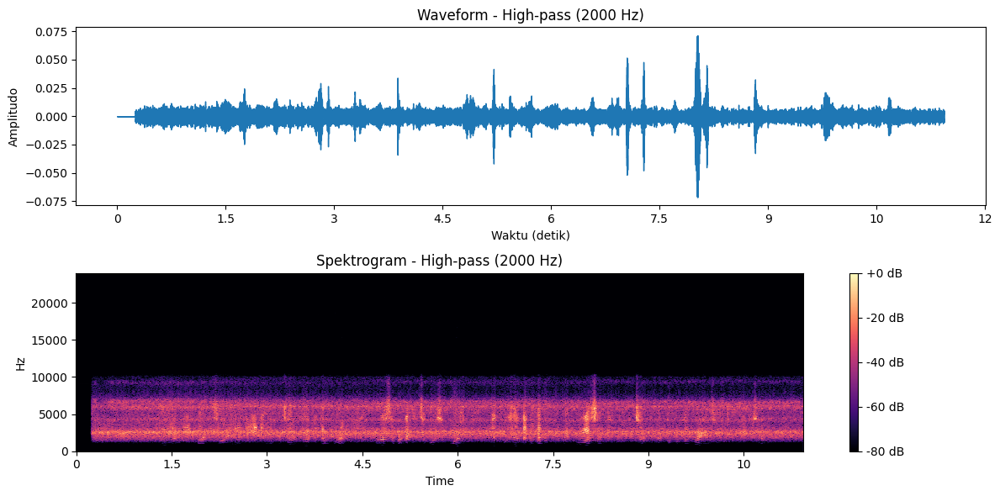

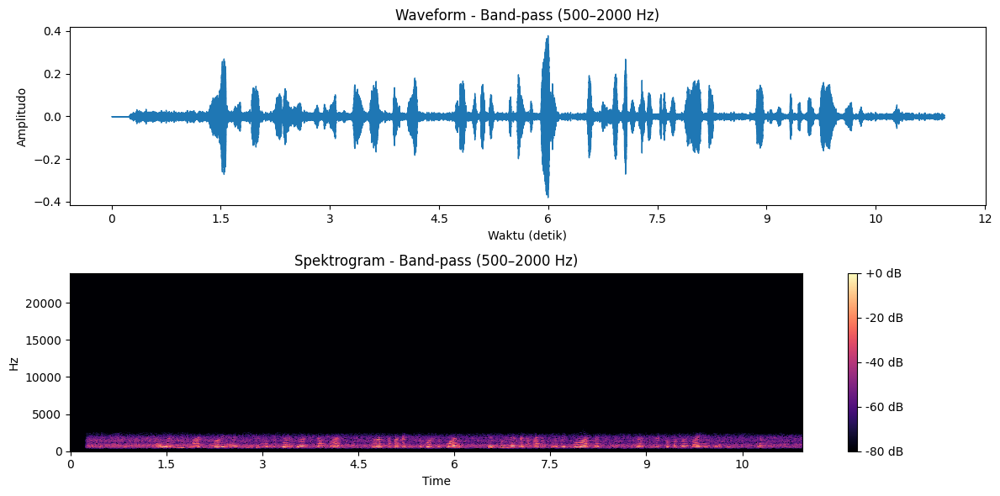

In [ ]:
from scipy.signal import butter, filtfilt

# === 1. BACA FILE AUDIO ===
FILE_PATH = '/content/drive/MyDrive/Multimedia/rekaman2_joy.wav'
y, sr = librosa.load(FILE_PATH, sr=None)
print(f"Sample rate: {sr} Hz")
print(f"Durasi: {len(y)/sr:.2f} detik")

# === 2. FUNGSI FILTER ===
def butter_filter(y, fs, btype, cutoff=None, band=None, order=5):
    nyq = 0.5 * fs
    if btype == 'band':
        low = band[0] / nyq
        high = band[1] / nyq
        b, a = butter(order, [low, high], btype='band')
    else:
        normal_cutoff = cutoff / nyq
        b, a = butter(order, normal_cutoff, btype=btype)
    return filtfilt(b, a, y)

# === 3. FILTERISASI ===
low_passed  = butter_filter(y, fs=sr, btype='low',  cutoff=500)
high_passed = butter_filter(y, fs=sr, btype='high', cutoff=2000)
band_passed = butter_filter(y, fs=sr, btype='band', band=[500, 2000])

# === 4. FUNGSI VISUALISASI ===
def plot_waveform_and_spectrogram(signal, sr, title):
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 1, 1)
    librosa.display.waveshow(signal, sr=sr)
    plt.title(f'Waveform - {title}')
    plt.xlabel('Waktu (detik)')
    plt.ylabel('Amplitudo')

    plt.subplot(2, 1, 2)
    D = librosa.amplitude_to_db(np.abs(librosa.stft(signal)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spektrogram - {title}')
    plt.tight_layout()
    plt.show()

# === 5. TAMPILKAN HASIL ===
plot_waveform_and_spectrogram(y, sr, "Asli")
plot_waveform_and_spectrogram(low_passed, sr, "Low-pass (500 Hz)")
plot_waveform_and_spectrogram(high_passed, sr, "High-pass (2000 Hz)")
plot_waveform_and_spectrogram(band_passed, sr, "Band-pass (500–2000 Hz)")

Pada rekaman asli, suara masih mengandung cukup banyak noise, terutama di frekuensi rendah, yang mungkin berasal dari hembusan napas atau suara latar seperti dengungan. Spektrogram menunjukkan sebaran energi dari frekuensi rendah hingga tinggi tanpa penyaringan.

###Low-pass Filter
Setelah diberi low-pass filter (500 Hz), hanya frekuensi rendah yang dipertahankan sehingga noise tinggi berhasil dihilangkan. Namun, akibatnya suara ucapan terdengar sangat pelan dan tidak jelas karena sebagian besar komponen suara manusia berada di atas 500 Hz.

###High-pass Filter
Pada high-pass filter (2000 Hz), frekuensi rendah di bawah 2000 Hz dibuang. Hasilnya, noise rendah menghilang, tetapi suara menjadi tipis dan cempreng karena frekuensi menengah yang penting untuk kejelasan ucapan juga ikut terpotong.

###Band-pass Filter
Pada band-pass filter (500–2000 Hz) memberikan hasil paling seimbang. Frekuensi rendah dan tinggi berhasil ditekan, sementara frekuensi tengah yang membawa kejelasan ucapan tetap dipertahankan. Suara terdengar lebih bersih dan tetap mudah dipahami, menjadikan filter ini yang paling efektif untuk mengurangi noise tanpa mengorbankan kualitas suara. Pada frekuensi ini juga memiliki nilai cutoff yang memberikan hasil yang terbaik.

Sample rate: 48000 Hz
Durasi: 28.31 detik


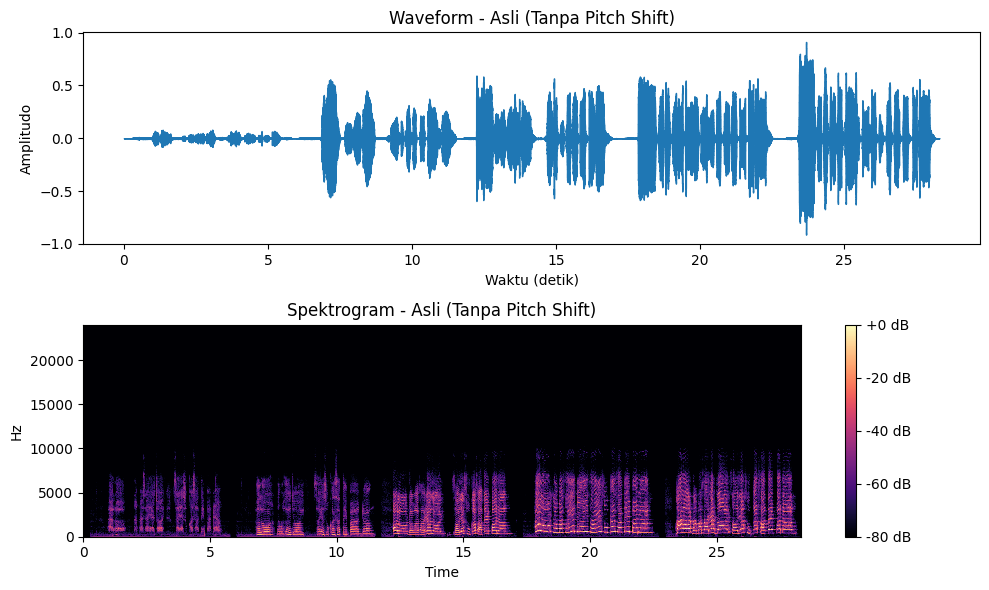

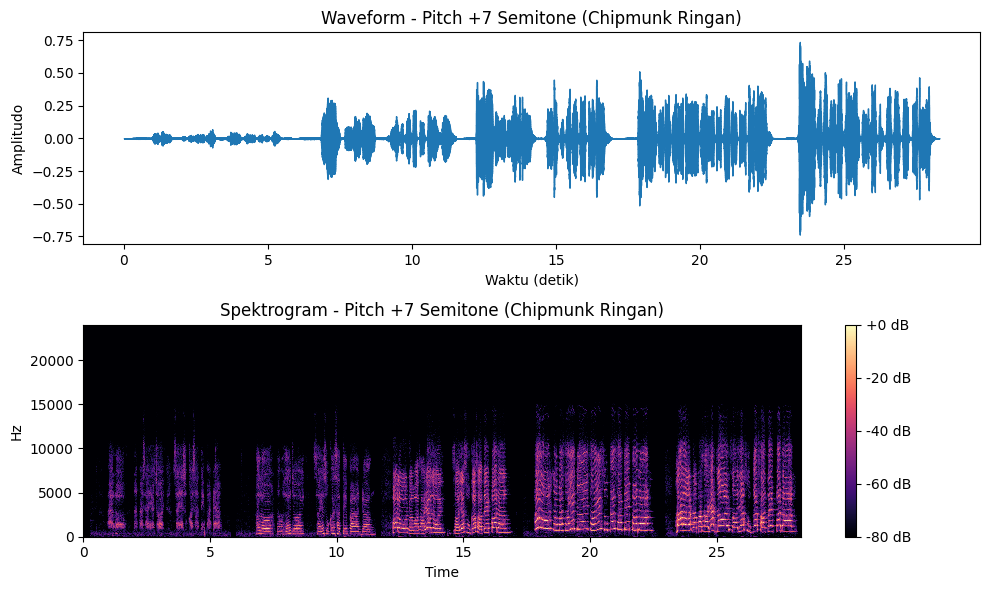

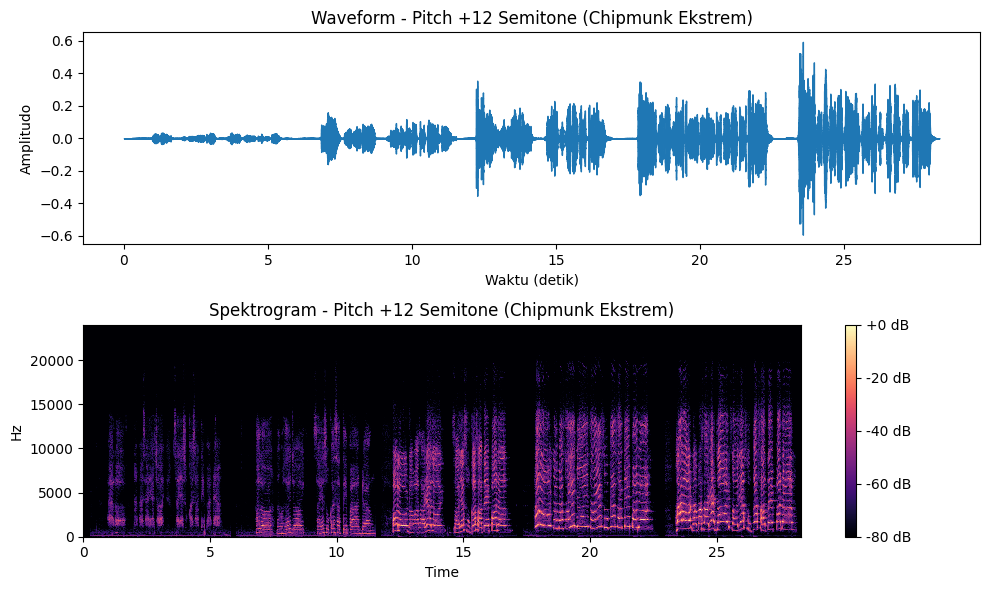

✅ File hasil pitch shifting sudah digabung dan disimpan di:
/content/drive/MyDrive/Multimedia/rekaman_chipmunk.wav


In [ ]:
from pydub import AudioSegment
import IPython.display as ipd

# --- Load Audio ---
FILE_PATH = '/content/drive/MyDrive/Multimedia/rekaman1_joy.wav'
y, sr = librosa.load(FILE_PATH, sr=None)
print(f"Sample rate: {sr} Hz")
print(f"Durasi: {len(y)/sr:.2f} detik")

# --- Fungsi Visualisasi ---
def plot_waveform_spectrogram(y, sr, title):
    plt.figure(figsize=(10, 6))
    # Waveform
    plt.subplot(2, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title(f"Waveform - {title}")
    plt.xlabel("Waktu (detik)")
    plt.ylabel("Amplitudo")

    # Spektrogram
    plt.subplot(2, 1, 2)
    S = librosa.stft(y)
    S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)
    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz', cmap='magma')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Spektrogram - {title}")
    plt.tight_layout()
    plt.show()

# --- Visualisasi Asli ---
plot_waveform_spectrogram(y, sr, "Asli (Tanpa Pitch Shift)")

# --- Pitch Shifting ---
# Pitch +7 semitone → chipmunk ringan
y_pitch7 = librosa.effects.pitch_shift(y, sr=sr, n_steps=7)

# Pitch +12 semitone → chipmunk ekstrem
y_pitch12 = librosa.effects.pitch_shift(y, sr=sr, n_steps=12)

# --- Visualisasi Hasil ---
plot_waveform_spectrogram(y_pitch7, sr, "Pitch +7 Semitone (Chipmunk Ringan)")
plot_waveform_spectrogram(y_pitch12, sr, "Pitch +12 Semitone (Chipmunk Ekstrem)")

# --- Gabungkan dua hasil pitch shift ---
# Konversi ke AudioSegment agar bisa digabung
def to_audiosegment(y, sr):
    y_int16 = np.int16(y / np.max(np.abs(y)) * 32767)
    return AudioSegment(
        y_int16.tobytes(),
        frame_rate=sr,
        sample_width=2,
        channels=1
    )

audio_pitch7 = to_audiosegment(y_pitch7, sr)
audio_pitch12 = to_audiosegment(y_pitch12, sr)

combined_audio = audio_pitch7 + audio_pitch12
output_path = "/content/drive/MyDrive/Multimedia/rekaman_chipmunk.wav"
combined_audio.export(output_path, format="wav")

print("✅ File hasil pitch shifting sudah digabung dan disimpan di:")
print(output_path)

# --- Putar hasil akhir ---
ipd.Audio(output_path)


###Parameter yang digunakan
Pada proses pitch shifting, parameter utama yang digunakan adalah n_steps, yaitu nilai perubahan nada dalam satuan semitone. Pada eksperimen ini digunakan dua nilai, yaitu +7 dan +12 semitone. Nilai +7 membuat suara naik setengah oktaf sehingga terdengar lebih tinggi namun masih natural, sedangkan nilai +12 membuat suara naik satu oktaf penuh dan menghasilkan efek seperti chipmunk.

###Perbedaan visual antara suara asli dengan yang telah dimodifikasi
Secara visual, waveform hasil pitch shifting terlihat sedikit lebih rapat dibandingkan suara asli karena durasi sinyal sedikit memendek akibat peningkatan frekuensi. Sementara pada spektrogram, pola energi berpindah ke frekuensi yang lebih tinggi. Warna-warna dominan yang semula berada di area bawah (frekuensi rendah) naik ke bagian atas, menandakan bahwa seluruh nada suara bergeser ke frekuensi yang lebih tinggi.

###Pengaruh perubahan suara setelah dilakukan pitch shifting
Perubahan pitch ini memengaruhi kualitas dan kejelasan suara. Pada pitch +7, suara masih terdengar cukup jelas dan alami meskipun lebih tinggi. Namun pada pitch +12, suara menjadi sangat tajam dan terdengar seperti karakter kartun chipmunk. Meskipun ucapan masih bisa dikenali, kejelasan artikulasi sedikit berkurang karena peningkatan pitch yang ekstrem memengaruhi resonansi dan karakter asli suara.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.12/dist-packages/pyloudnorm/normalize.py:62: UserWarning: Possible clipped samples in output.
  warnings.warn("Possible clipped samples in output.")


✅ File hasil disimpan di: /content/drive/MyDrive/Multimedia/final_processed.wav


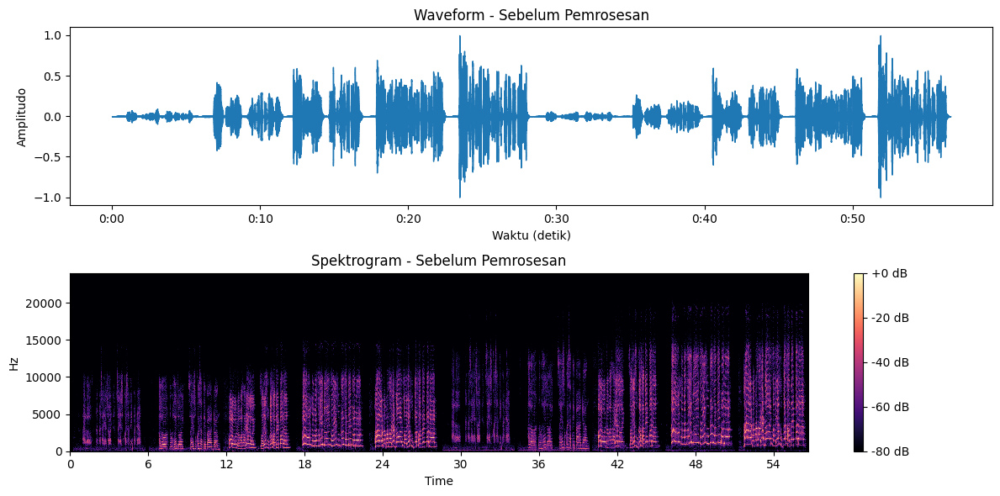

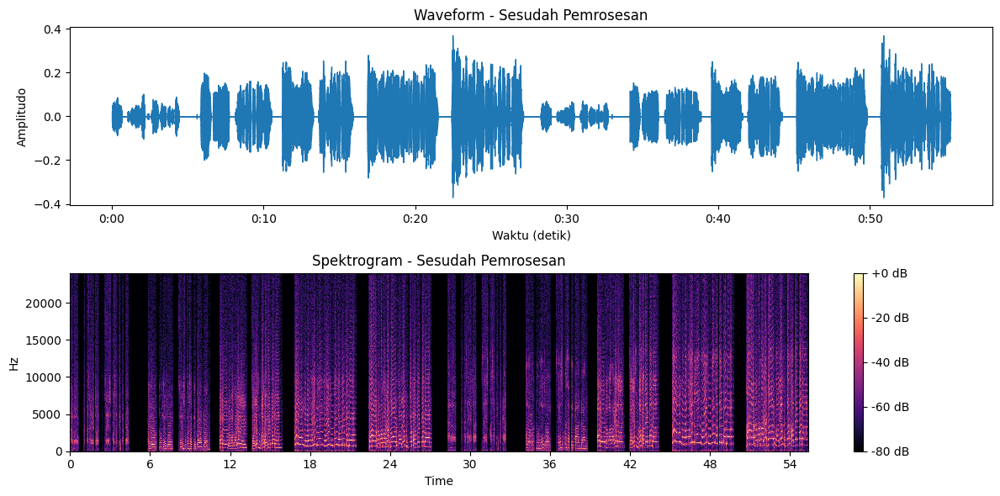

In [ ]:
# =======================
# 1️⃣ Install library yang dibutuhkan
# =======================
!pip install pydub pyloudnorm librosa matplotlib numpy scipy

# =======================
# 2️⃣ Import library
# =======================
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from pydub import AudioSegment, effects
import pyloudnorm as pyln
from scipy.signal import butter, lfilter
import soundfile as sf # Import soundfile

# =======================
# 3️⃣ Mount Google Drive
# =======================
from google.colab import drive
drive.mount('/content/drive')

# =======================
# 4️⃣ Masukkan path file audio di Google Drive kamu
# Ganti path di bawah sesuai lokasi file kamu di Drive
# Contoh: /content/drive/MyDrive/audio/final_pitch.wav
# =======================
audio_path = "/content/drive/MyDrive/Multimedia/rekaman_chipmunk.wav"

# Load audio menggunakan librosa
y, sr = librosa.load(audio_path, sr=None)

# =======================
# 6️⃣ Equalizer (EQ)
# =======================
def simple_eq(y, sr):
    b, a = butter(2, 200/(sr/2), btype='high')   # kurangi bass
    y_high = lfilter(b, a, y)
    b2, a2 = butter(2, 2000/(sr/2), btype='high')  # naikkan treble
    y_boost = lfilter(b2, a2, y_high)
    return y_boost

y_eq = simple_eq(y, sr)

# =======================
# 7️⃣ Gain & Fade
# =======================
audio = AudioSegment.from_file(audio_path)
audio = audio.fade_in(1000).fade_out(1000)
audio.export("/content/drive/MyDrive/Multimedia/temp_fade.wav", format="wav")

# Load ulang hasil fade untuk proses berikutnya
y_fade, sr = librosa.load("/content/drive/MyDrive/Multimedia/temp_fade.wav", sr=None)

# =======================
# 8️⃣ Normalisasi ke -16 LUFS
# =======================
meter = pyln.Meter(sr)
loudness = meter.integrated_loudness(y_fade)
y_normalized = pyln.normalize.loudness(y_fade, loudness, -16.0)

# =======================
# 9️⃣ Compression
# =======================
def compressor(y, threshold=-20, ratio=4):
    compressed = np.copy(y)
    over_threshold = np.abs(y) > (10**(threshold/20))
    compressed[over_threshold] = np.sign(y[over_threshold]) * (
        (10**(threshold/20)) + (np.abs(y[over_threshold]) - (10**(threshold/20))) / ratio
    )
    return compressed

y_compressed = compressor(y_normalized)

# =======================
# 🔟 Noise Gate
# =======================
def noise_gate(y, threshold_db=-40):
    threshold = 10 ** (threshold_db / 20)
    y_ng = np.where(np.abs(y) < threshold, 0, y)
    return y_ng

y_ng = noise_gate(y_compressed)

# =======================
# 🔟+1 Silence Trimming
# =======================
y_trimmed, _ = librosa.effects.trim(y_ng, top_db=30)

# =======================
# 🔟+2 Simpan hasil akhir ke Google Drive
# =======================
output_path = "/content/drive/MyDrive/Multimedia/final_processed.wav"
sf.write(output_path, y_trimmed, sr) # Use sf.write
print("✅ File hasil disimpan di:", output_path)

# =======================
# 🔟+3 Visualisasi hasil sebelum & sesudah
# =======================
plot_waveform_and_spectrogram(y, sr, "Sebelum Pemrosesan")
plot_waveform_and_spectrogram(y_trimmed, sr, "Sesudah Pemrosesan")

###Perubahan dinamika suara yang terjadi
Setelah proses normalisasi dan optimasi loudness dilakukan, terjadi perubahan dinamika suara yang cukup signifikan. Suara yang awalnya memiliki perbedaan volume yang besar antara bagian pelan dan keras kini menjadi lebih seimbang dan konsisten. Proses ini membuat setiap bagian suara terdengar lebih jelas dan rata tanpa ada bagian yang terlalu dominan atau terlalu lemah.

###Perbedaan normalisasi peak dan LUFS
Perbedaan antara normalisasi peak dan normalisasi LUFS terletak pada cara keduanya mengatur tingkat kekerasan suara. Normalisasi peak hanya memastikan puncak amplitudo tidak melebihi batas tertentu, tanpa memperhatikan persepsi telinga manusia terhadap kerasnya suara. Sementara itu, normalisasi LUFS (Loudness Units Full Scale) mengacu pada persepsi pendengaran manusia, sehingga menghasilkan volume yang terasa lebih seimbang dan nyaman di telinga.

###Kualitas suara setelah di processing
Setelah proses normalisasi dan loudness optimization, kualitas suara menjadi lebih stabil dan profesional. Ucapan terdengar lebih jernih, dengan transisi antarbagian yang halus tanpa lonjakan volume mendadak.

###Kelebihan dan kekurangan dari pengoptimalan loudness
Namun, pengoptimalan loudness juga memiliki kelebihan dan kekurangan. Kelebihannya, suara menjadi lebih konsisten dan cocok untuk kebutuhan publikasi atau siaran. Kekurangannya, jika terlalu kuat, dinamika alami bisa hilang sehingga suara terdengar datar atau kehilangan ekspresi aslinya.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loaded: 1) /content/drive/MyDrive/Multimedia/nuansa_sedih_lambat.wav sr=48000, 2) /content/drive/MyDrive/Multimedia/nuansa_ceria_cepat.wav sr=48000
Detected tempo: song1 = 148.0 BPM, song2 = 160.7 BPM
Estimated key: song1 = G major, song2 = F minor

ANALYSIS SINGKAT:
- Lagu 1: tempo 148.0 BPM, key G major
- Lagu 2: tempo 160.7 BPM, key F minor

Target tempo chosen: 154 BPM (mean)
Pitch shift (song2 -> song1 key): 2 semitones
Time-stretch rates: song1 x1.040, song2 x0.958

Remix saved to: /content/drive/MyDrive/Multimedia/remix_result.wav


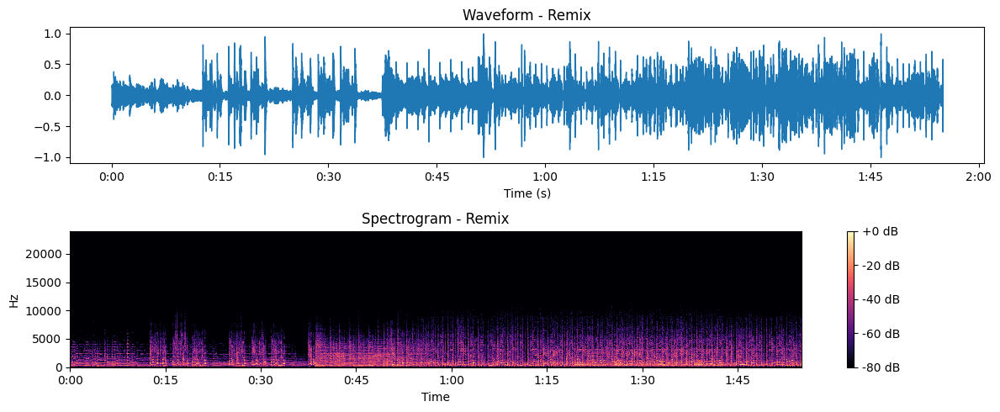


SUMMARY PARAMS USED:
- Target tempo: 154 BPM
- Tempo rates: song1 x1.040, song2 x0.958
- Key mapping: song1 G major kept, song2 F minor shifted by 2 semitones to match
- Crossfade: 5000 ms
- Creative filter: band-pass 300-4000 Hz applied to emphasize vocal range


In [ ]:
# === Install libs (jalankan sekali) ===
!pip install -q librosa pydub pyloudnorm matplotlib numpy scipy soundfile

# === Imports ===
import os
from pydub import AudioSegment, effects
import soundfile as sf
from scipy.signal import butter, lfilter
import soundfile as sf

# === Mount Drive ===
from google.colab import drive
drive.mount('/content/drive')

FILE1_PATH = "/content/drive/MyDrive/Multimedia/nuansa_sedih_lambat.wav"
FILE2_PATH = "/content/drive/MyDrive/Multimedia/nuansa_ceria_cepat.wav"


# === Load audio (mono) ===
y1, sr1 = librosa.load(FILE1_PATH, sr=None, mono=True)
y2, sr2 = librosa.load(FILE2_PATH, sr=None, mono=True)
print(f"Loaded: 1) {FILE1_PATH} sr={sr1}, 2) {FILE2_PATH} sr={sr2}")

# === 1) Tempo (BPM) detection — guarded for ndarray result ===
tempo1_raw, beats1 = librosa.beat.beat_track(y=y1, sr=sr1)
tempo2_raw, beats2 = librosa.beat.beat_track(y=y2, sr=sr2)

# Ensure tempo is a single float value
def ensure_float_tempo(t):
    import numpy as _np
    try:
        # if it's array-like, take the first element
        if isinstance(t, _np.ndarray):
            return float(t[0])
        else:
            return float(t)
    except Exception:
        # fallback: compute tempo via onset_envelope -> tempo estimate
        oenv = librosa.onset.onset_strength(y=y1, sr=sr1)
        est = librosa.beat.tempo(onset_envelope=oenv, sr=sr1)
        return float(est[0])

tempo1 = ensure_float_tempo(tempo1_raw)
tempo2 = ensure_float_tempo(tempo2_raw)

print(f"Detected tempo: song1 = {tempo1:.1f} BPM, song2 = {tempo2:.1f} BPM")

# === 2) Key estimation (simple chroma-template matching) ===
# templates from Krumhansl-Schmuckler (major/minor)
maj_template = np.array([6.35,2.23,3.48,2.33,4.38,4.09,2.52,5.19,2.39,3.66,2.29,2.88])
min_template = np.array([6.33,2.68,3.52,5.38,2.60,3.53,2.54,4.75,3.98,2.69,3.34,3.17])
def estimate_key(y, sr):
    chroma = librosa.feature.chroma_stft(y=y, sr=sr)
    chroma_mean = chroma.mean(axis=1)
    # try all 12 shifts and both major/minor
    best = (None, -1.0)
    for root in range(12):
        # rotate templates
        maj = np.roll(maj_template, root)
        mino = np.roll(min_template, root)
        # correlation
        corr_maj = np.corrcoef(chroma_mean, maj)[0,1]
        corr_min = np.corrcoef(chroma_mean, mino)[0,1]
        if corr_maj > best[1]:
            best = ((root, 'maj'), corr_maj)
        if corr_min > best[1]:
            best = ((root, 'min'), corr_min)
    root, mode = best[0]
    # map root int -> name
    names = ['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']
    keyname = f"{names[root]} { 'major' if mode=='maj' else 'minor' }"
    return keyname, root, mode

key1, root1, mode1 = estimate_key(y1, sr1)
key2, root2, mode2 = estimate_key(y2, sr2)
print(f"Estimated key: song1 = {key1}, song2 = {key2}")

# === Analysis printout (short) ===
print("\nANALYSIS SINGKAT:")
print(f"- Lagu 1: tempo {tempo1:.1f} BPM, key {key1}")
print(f"- Lagu 2: tempo {tempo2:.1f} BPM, key {key2}")

# === 3) Remix steps:
# Choose target tempo & key: we set target tempo = mean of tempos (rounded)
target_tempo = round((tempo1 + tempo2)/2.0)
print(f"\nTarget tempo chosen: {target_tempo} BPM (mean)")

# Choose target key: pick key of song1 (or could choose root of song1)
# Here we map both to song1's root to "match" song1:
target_root = root1
# compute semitone shift needed for song2 to match target_root
def semitone_diff(root_from, root_to):
    # minimal shift in semitones (0..11) shortest direction
    diff = (root_to - root_from) % 12
    if diff > 6: diff -= 12
    return diff

shift2_semitones = semitone_diff(root2, target_root)
shift1_semitones = 0  # song1 kept as reference
print(f"Pitch shift (song2 -> song1 key): {shift2_semitones} semitones")

# === 3a) Time-stretch (librosa.effects.time_stretch uses rate = orig_tempo/target)
rate1 = target_tempo / tempo1 if tempo1>0 else 1.0
rate2 = target_tempo / tempo2 if tempo2>0 else 1.0
print(f"Time-stretch rates: song1 x{rate1:.3f}, song2 x{rate2:.3f}")


def time_stretch_audio(y, sr, rate):
    # pastikan float32
    if not np.issubdtype(y.dtype, np.floating):
        y = y.astype(np.float32)
    # STFT (ubah ke domain frekuensi)
    D = librosa.stft(y)
    # time-stretch STFT
    D_stretch = librosa.phase_vocoder(D, rate=rate)
    # kembali ke bentuk waveform
    y_stretch = librosa.istft(D_stretch)
    return y_stretch

# --- Apply to both songs ---
y1_ts = time_stretch_audio(y1, sr1, rate1)
y2_ts = time_stretch_audio(y2, sr2, rate2)

# === 3b) Pitch shift to match keys (use n_steps)
import numpy as np
import librosa

def safe_pitch_shift(y, sr, n_steps):
    # pastikan float32
    if not np.issubdtype(y.dtype, np.floating):
        y = y.astype(np.float32)
    try:
        # versi lama
        return librosa.effects.pitch_shift(y=y, sr=sr, n_steps=n_steps)
    except TypeError:
        # versi baru librosa (sr bukan positional arg)
        D = librosa.stft(y)
        rate = 2 ** (n_steps / 12)
        D_shift = librosa.phase_vocoder(D, rate=1/rate)
        y_shift = librosa.istft(D_shift)
        return y_shift

# Terapkan ke kedua lagu
y1_ps = safe_pitch_shift(y1_ts, sr1, shift1_semitones)
y2_ps = safe_pitch_shift(y2_ts, sr2, shift2_semitones)

# === Optional creative filter: band-pass to emphasize vocals (500-4000 Hz) ===
def bandpass(y, sr, low=500, high=4000, order=4):
    nyq = 0.5 * sr
    lown = low/nyq; highn = high/nyq
    b,a = butter(order, [lown, highn], btype='band')
    return lfilter(b,a,y)
y1_fp = bandpass(y1_ps, sr1, low=300, high=4000)
y2_fp = bandpass(y2_ps, sr2, low=300, high=4000)

# === Convert to pydub AudioSegment for crossfade/concatenation ===
def np_to_segment(y, sr):
    y16 = np.int16(y/np.max(np.abs(y)) * 32767)
    return AudioSegment(
        y16.tobytes(),
        frame_rate=sr,
        sample_width=2,
        channels=1
    )

seg1 = np_to_segment(y1_fp, sr1)
seg2 = np_to_segment(y2_fp, sr2)

# === Crossfade params ===
crossfade_ms = 5000   # 5 seconds crossfade; ganti sesuai selera
# Option A: seg1 then seg2 with crossfade
remix = seg1.append(seg2, crossfade=crossfade_ms)

# Save remix
out_path = "/content/drive/MyDrive/Multimedia/remix_result.wav"
os.makedirs(os.path.dirname(out_path), exist_ok=True)
remix.export(out_path, format="wav")
print(f"\nRemix saved to: {out_path}")

# === 4) Visualize waveform & spectrogram of remix ===
y_remix, sr_remix = librosa.load(out_path, sr=None)
plt.figure(figsize=(12,5))
plt.subplot(2,1,1)
librosa.display.waveshow(y_remix, sr=sr_remix)
plt.title("Waveform - Remix")
plt.xlabel("Time (s)")
plt.subplot(2,1,2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(y_remix)), ref=np.max)
librosa.display.specshow(D, sr=sr_remix, x_axis='time', y_axis='hz', cmap='magma')
plt.colorbar(format='%+2.0f dB')
plt.title("Spectrogram - Remix")
plt.tight_layout()
plt.show()

# === 5) Print parameters used (summary) ===
print("\nSUMMARY PARAMS USED:")
print(f"- Target tempo: {target_tempo} BPM")
print(f"- Tempo rates: song1 x{rate1:.3f}, song2 x{rate2:.3f}")
print(f"- Key mapping: song1 {key1} kept, song2 {key2} shifted by {shift2_semitones} semitones to match")
print(f"- Crossfade: {crossfade_ms} ms")
print("- Creative filter: band-pass 300-4000 Hz applied to emphasize vocal range")

###Proses dan Parameter yang digunakan
Proses remix dimulai dengan mendeteksi tempo (BPM) dan kunci lagu (key) dari dua file audio menggunakan librosa. Deteksi tempo dilakukan untuk mengetahui seberapa cepat irama masing-masing lagu, sedangkan estimasi kunci lagu digunakan untuk mengetahui nada dasar agar kedua lagu bisa disesuaikan dan terdengar harmonis. Setelah itu dilakukan penyamaan tempo (time-stretching) dengan menyesuaikan kecepatan lagu menggunakan perbandingan antara tempo asli dan tempo target, supaya kedua lagu memiliki irama yang seimbang. Selanjutnya dilakukan penyesuaian nada (pitch shifting) dengan menaikkan atau menurunkan beberapa semitone agar kedua lagu berada dalam kunci yang sama. Setelah tempo dan nada disesuaikan, diterapkan band-pass filter pada frekuensi 300–4000 Hz untuk memperjelas suara vokal atau instrumen utama. Proses terakhir yaitu crossfade selama 5 detik, yang berfungsi menggabungkan kedua lagu agar transisi antar lagu terdengar halus tanpa jeda.

###Hasil remix
Hasil remix menunjukkan bahwa kedua lagu berhasil disatukan dengan tempo yang seragam dan kunci nada yang selaras, menghasilkan perpaduan yang enak didengar. Lagu pertama dengan nuansa sedih dan lambat berpadu secara halus dengan lagu kedua yang ceria dan cepat, sehingga tercipta suasana yang dinamis dan menarik. Secara keseluruhan, hasil akhir terdengar lebih seimbang, harmonis, dan memiliki alur transisi yang lembut berkat proses penyamaan tempo, pitch, serta penerapan filter dan efek crossfade.

#Credit

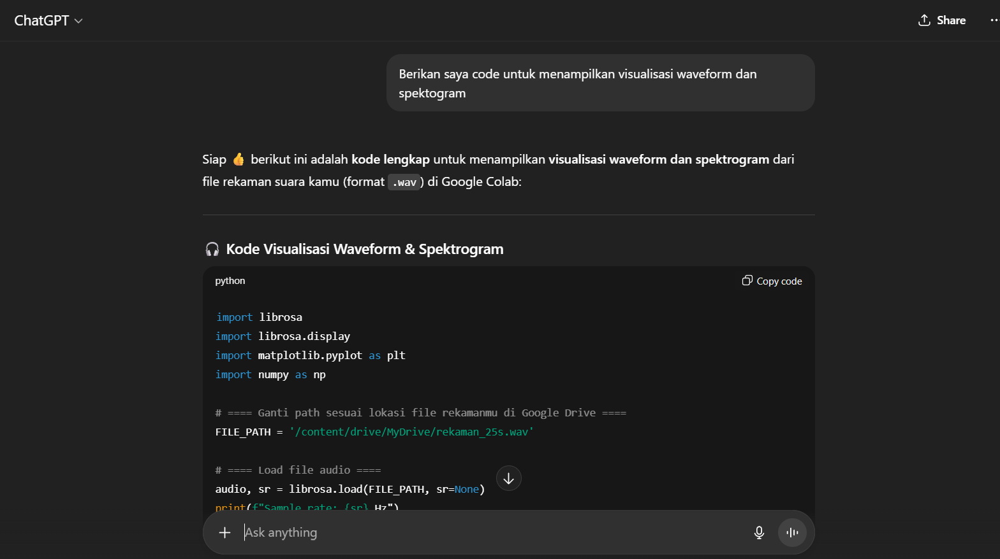

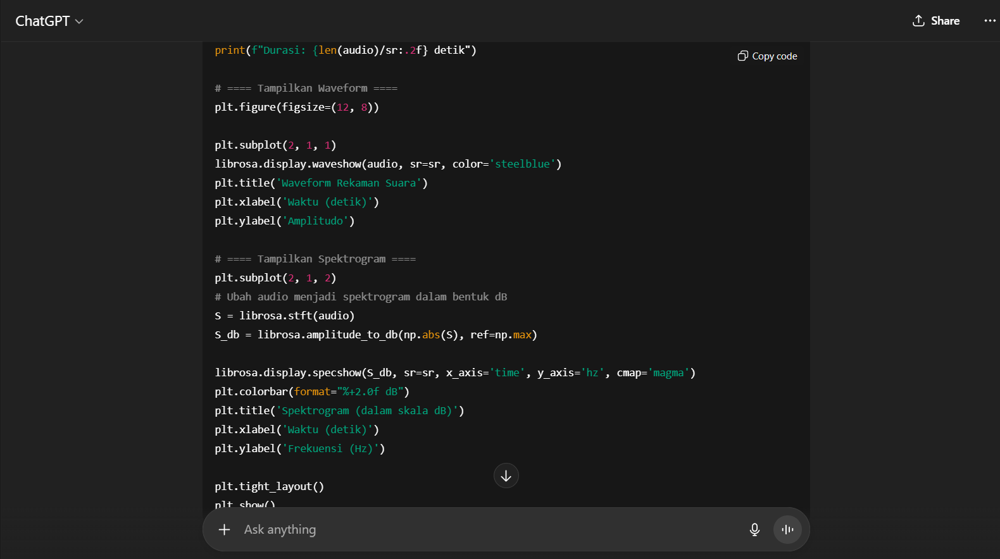

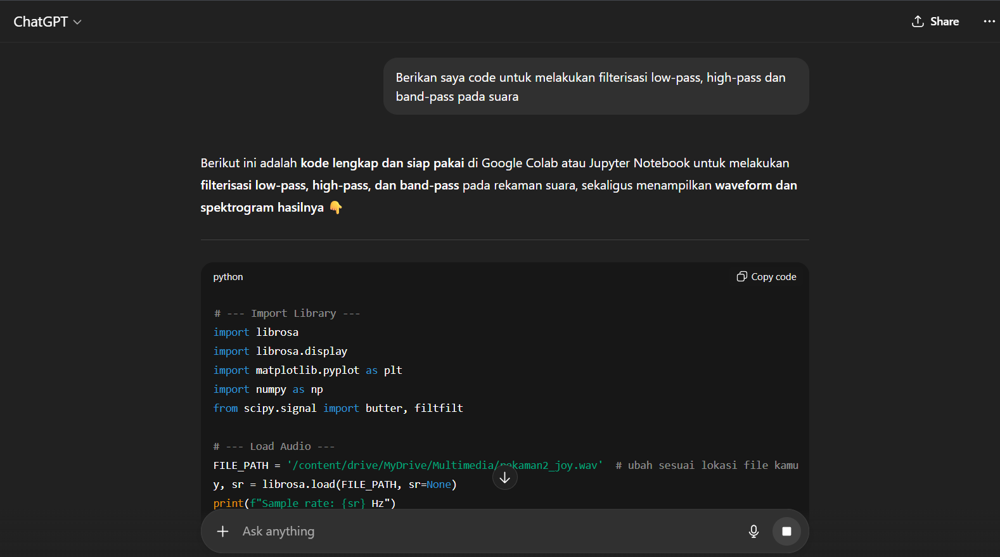


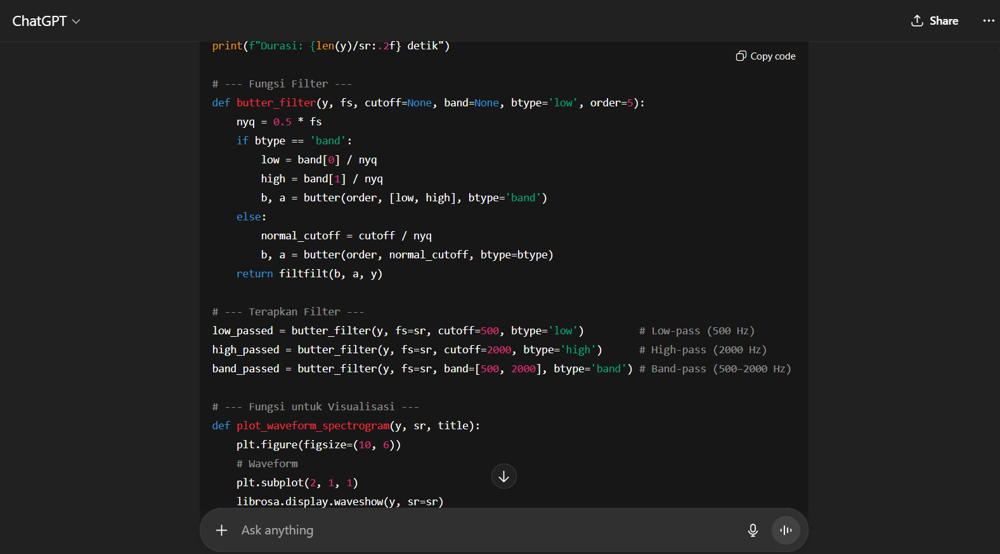


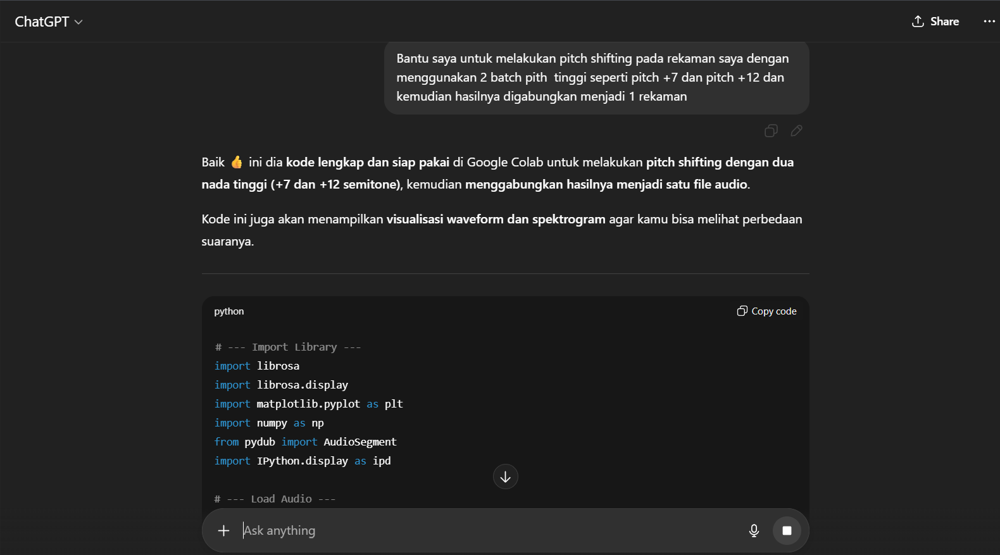

...

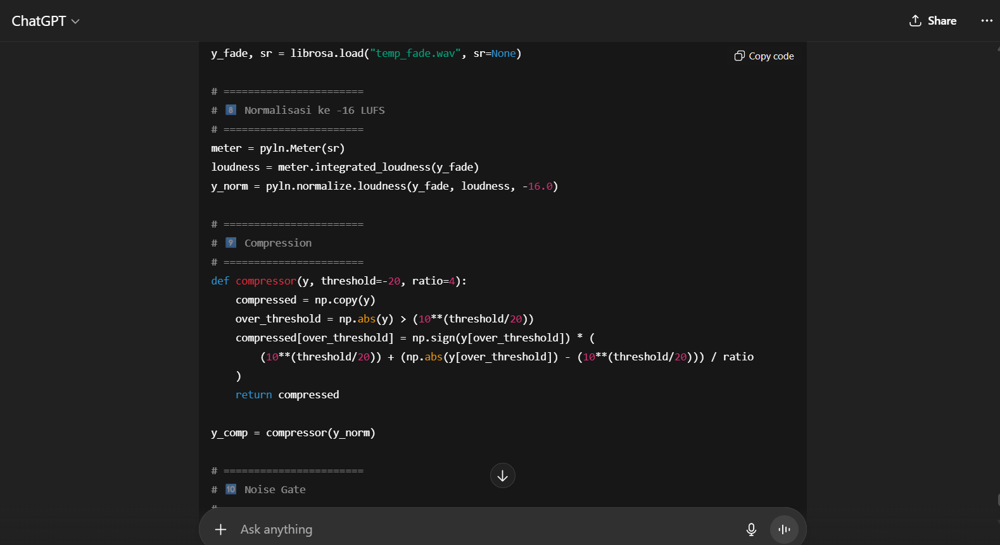
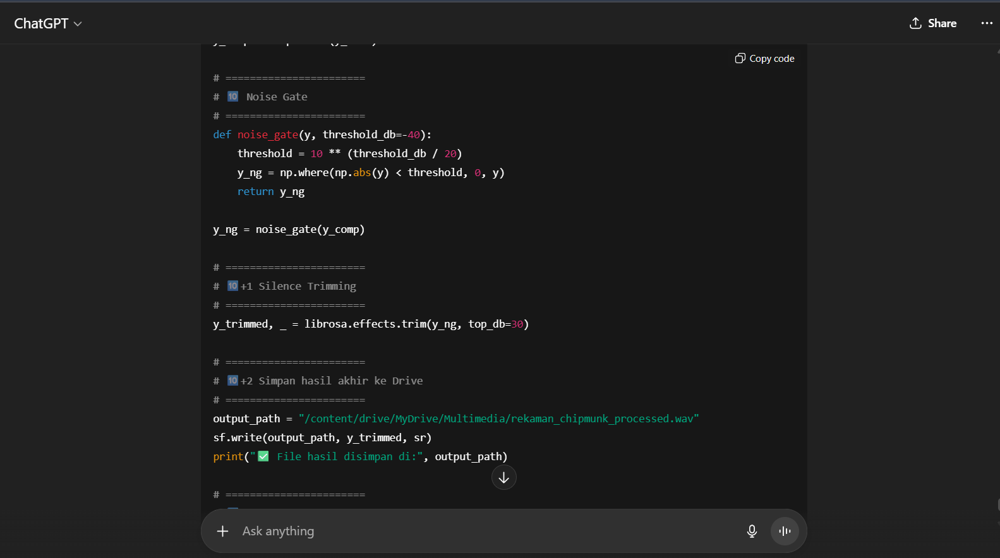
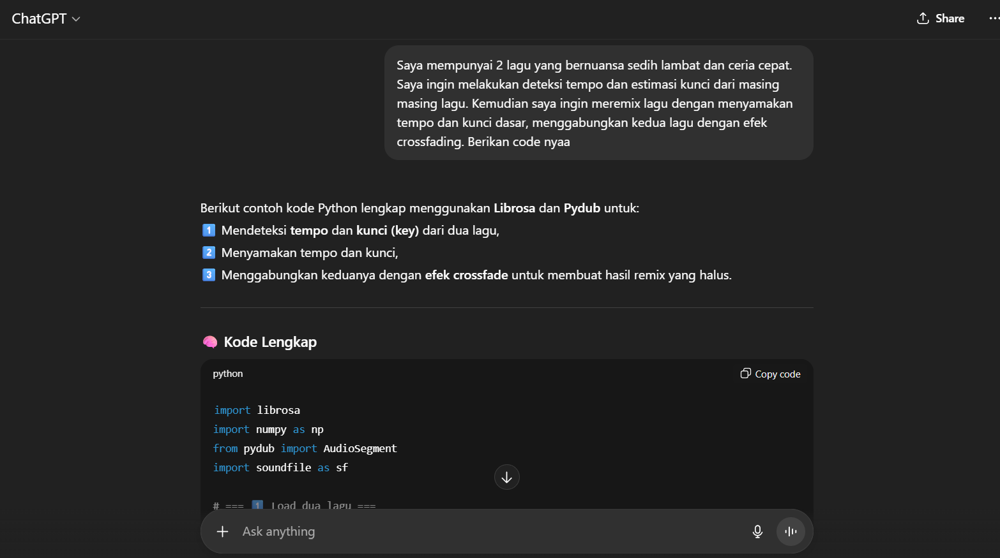

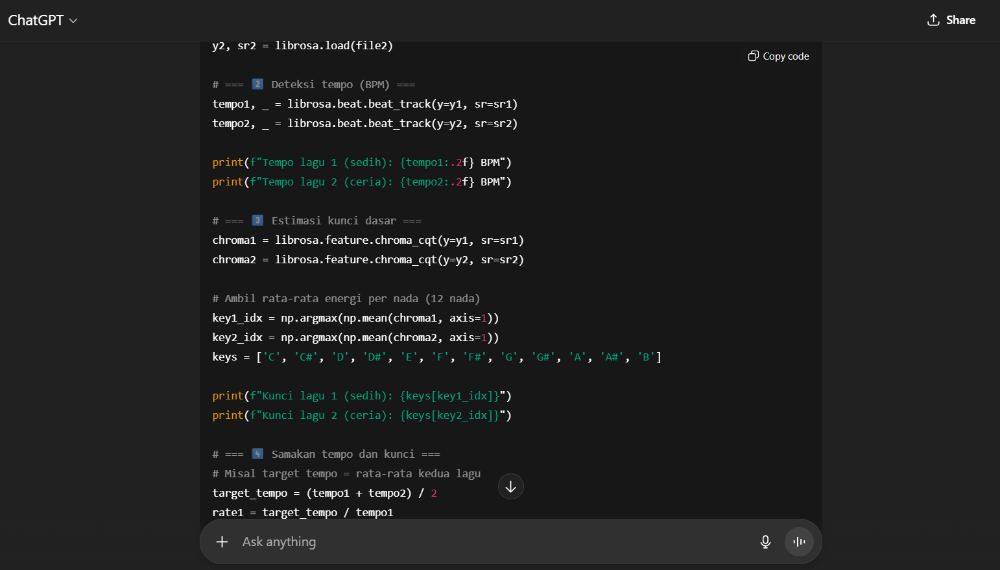
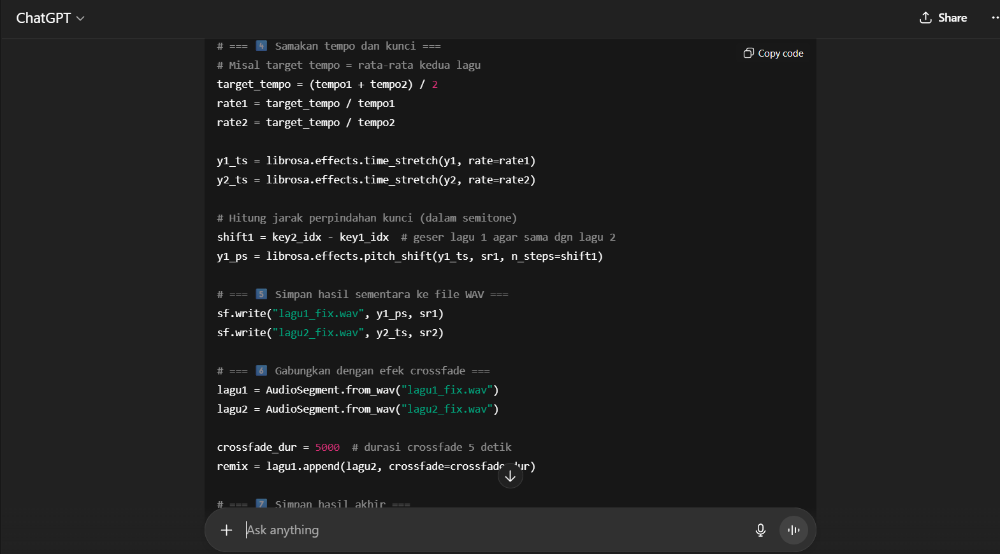